5.1 Generate a time series from an IID Gaussian random process.This is a memory-  
less,stationary series:   
(a) Compute the ADF statisticon this series. What is the p-value?  

In [1]:
import pandas as pd
import numpy as np
from statsmodels.tsa.stattools import adfuller

gaussian_time=np.random.normal(size=1000)
result = adfuller(gaussian_time)
print('ADF Statistic: %f' % result[0])

ADF Statistic: -13.337560


(b) Compute the cumulative sum of the observations. This is a non-stationary
series without memory.

(i) What is the order of integration of this cumulative series?   
(ii) Compute the ADF statistic on this series. What is the p-value?

In [2]:
gaussian_cumsum=np.cumsum(gaussian_time)
diff_cnt=0;
while True:
    print('ADF Statistic: %f' % result[0], 'P-value: %f' % result[1], 'Diff cnt: %d' % diff_cnt)
    result = adfuller(gaussian_cumsum)
    if result[1] < 0.05:
        break
    gaussian_cumsum=np.diff(gaussian_cumsum)
    diff_cnt += 1


ADF Statistic: -13.337560 P-value: 0.000000 Diff cnt: 0
ADF Statistic: -1.270972 P-value: 0.642346 Diff cnt: 1


(c) Differentiate the series twice. What is the p-value of this over-differentiated
series?

In [3]:
gaussian_cumsum = np.cumsum(gaussian_time)
gaussian_cumsum=np.diff(np.diff(gaussian_cumsum))
result = adfuller(gaussian_cumsum)
print('ADF Statistic: %f' % result[0], 'P-value: %f' % result[1])

ADF Statistic: -12.593821 P-value: 0.000000


5.2 Generate a time series that follows a sinusoidal function.   
This is a stationary series with memory.  
(a) Compute the ADF statistic on this series. What is the p-value?

In [4]:
freq=20
freq_sample=10
amplitude=1
t=np.linspace(0, 100, 10*freq_sample, endpoint=False)
x=np.sin(2*np.pi*freq*t)*amplitude

result = adfuller(x)
print('ADF Statistic: %f' % result[0], 'P-value: %f' % result[1])

ADF Statistic: -1.265556 P-value: 0.644780


(b) Shift every observation by the same positive value.Compute the cumulative   
sum of the observations. This is a non-stationary series with memory.

(i) Compute the ADF statistic on this series. What is the p-value?

In [5]:
x+=1
cumsum_x=np.cumsum(x)
result = adfuller(cumsum_x)
print('ADF Statistic: %f' % result[0], 'P-value: %f' % result[1])

ADF Statistic: -4.121728 P-value: 0.000891


(b) Apply an expanding window fracdiff,with 𝜏 = 1E−2. For what mini-
mum d value do you get a p-value below 5%?

In [6]:
def get_weights(d:float, size):
    w=[1.]
    for k in range(1, size):
        w.append(-w[-1]*(d-k+1)/k)
    return np.array(w[::-1]).reshape(-1, 1)

def frational_diff(df:pd.DataFrame, d:float, threshold:float=0.1):
    '''
    분수도함수를 구현한 함수이다
    :param series: 시계열 데이터
    :param d: 분수도함수의 차수
    :param threshold: weight 감쇠의 최소값
    '''
    w=get_weights(d, len(df.index))

    # relative weight loss가 threshold보다 작은 경우는 제거
    w_=np.cumsum(abs(w))
    w_/=w_[-1]
    skip=w_[w_>threshold].shape[0]

    # 시게열 데이터에 weight 적용
    ret={}
    for name in df.columns:
        filled_series=df[[name]].bfill().dropna()
        df_=pd.Series()
        for iloc in range(skip, filled_series.shape[0]):
            loc=filled_series.index[iloc]
            if not np.isfinite(df.loc[loc, name]): continue
            df_[loc]=np.dot(w[-(iloc+1):, :].T, filled_series.loc[:loc])[0, 0]
        ret[name]=df_.copy(deep=True)
    return pd.concat(ret, axis=1)

df=pd.DataFrame({'test':cumsum_x})
test_range=np.arange(0.01, 3, 0.01)
for d in test_range:
    df_=frational_diff(df, d, 1e-2)
    if len(df_['test'])<1: continue
    result = adfuller(df_['test'])
    print('d: %f, ADF Statistic: %f' % (d, result[0]), 'P-value: %f' % result[1])
    if result[1] < 0.05:
        break


d: 0.010000, ADF Statistic: -40.826765 P-value: 0.000000


(iii) Apply FFD, with 𝜏 = 1E−5. 
For what minimum d value do you get a p-value below 5%?

In [7]:
def get_weights_fixed_width_window(d:float, threshold:float=1e-5):
    w=[1.]
    k=1
    while True:
        w.append(-w[-1]*(d-k+1)/k)
        if abs(w[-1]) < threshold:
            break
        k += 1
    return np.array(w[::-1]).reshape(-1, 1)

def frac_diff_fixed_width_window(df:pd.DataFrame, d:float, threshold:float=1e-5):
    w=get_weights_fixed_width_window(d, threshold)
    width=len(w)-1
    ret={}
    for name in df.columns:
        filled_series=df[[name]].bfill().dropna()
        df_=pd.Series()
        for iloc in range(width, filled_series.shape[0]):
            loc0, loc1=filled_series.index[iloc-width], filled_series.index[iloc]
            if not np.isfinite(df.loc[loc1, name]): continue
            df_[loc1]=np.dot(w.T, filled_series.loc[loc0:loc1])[0, 0]
        ret[name]=df_.copy(deep=True)
    return pd.concat(ret, axis=1)
df=pd.DataFrame({'test':cumsum_x})
test_range=np.arange(0.01, 3, 0.01)
for d in test_range:
    df_=frac_diff_fixed_width_window(df, d, 1e-2)
    if len(df_['test'])<1: continue
    result = adfuller(df_['test'])
    print('d: %f, ADF Statistic: %f' % (d, result[0]), 'P-value: %f' % result[1])
    if result[1] < 0.05:
        break

d: 0.010000, ADF Statistic: -3.879294 P-value: 0.002193


5.3 Take the seriesfrom exercise 2.b:  
(a) Fit the series to a sine function. What is the R-squared?

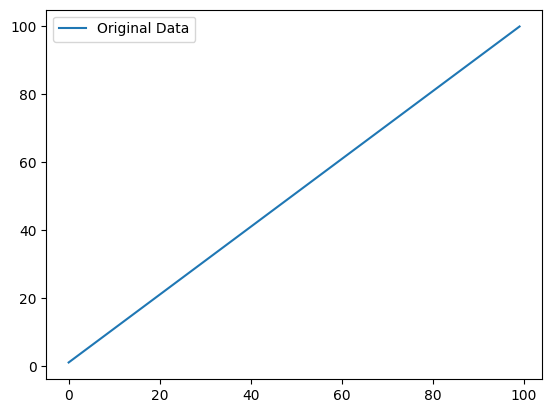

R^2: 1.000000


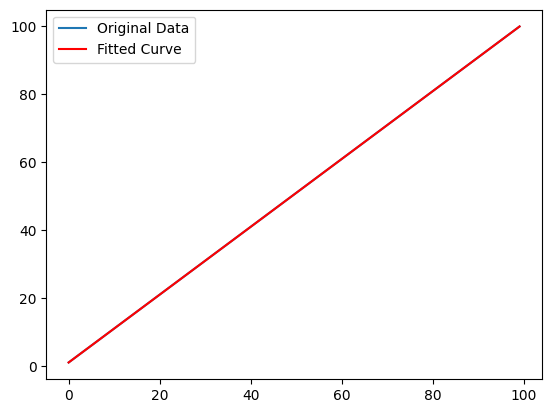

In [8]:
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
def sine_func(x, A, w, phi, C):
    return A * np.sin(w * x + phi) + C

plt.plot(t, cumsum_x, label='Original Data')
plt.legend()
plt.show()

ff=np.fft.fftfreq(len(t), t[1]-t[0])
y_freq=abs(np.fft.fft(cumsum_x))
guess_freq=abs(ff[np.argmax(y_freq[1:])+1])
guess_amp=np.std(cumsum_x)*np.sqrt(2)
guess_offset=np.mean(cumsum_x)
initial_guess = [guess_amp, 2*np.pi*guess_freq, 0, guess_offset]
params, _ = curve_fit(sine_func, t, cumsum_x, p0=initial_guess, maxfev=100000)
y_fit = sine_func(t, *params)
r_2=np.sum((y_fit-np.mean(cumsum_x)) ** 2)/np.sum((cumsum_x-np.mean(cumsum_x)) ** 2)
print('R^2: %f' % r_2)
import matplotlib.pyplot as plt
plt.plot(t, cumsum_x, label='Original Data')
plt.plot(t, y_fit, label='Fitted Curve', color='red')
plt.legend()
plt.show()

Apply FFD(d=1). Fit the series to a sine function. What is the R-squared?

R^2: 0.999941


/var/folders/4t/tqsscz0s6wn8sp8kh0264n680000gn/T/ipykernel_81449/1057988521.py:12: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(sine_func, t_, df_['test'], p0=initial_guess, maxfev=10000)


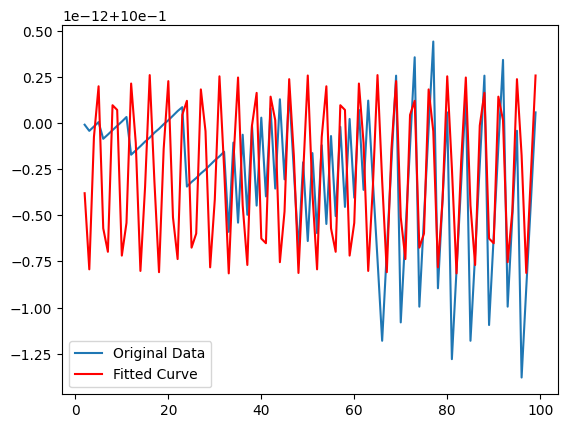

In [9]:
df=pd.DataFrame({'test':cumsum_x})
df_=frac_diff_fixed_width_window(df, 1)
t_=t[-len(df_['test']):]

ff=np.fft.fftfreq(len(t_), t_[1]-t_[0])
y_freq=abs(np.fft.fft(df_['test'].values))
guess_freq=abs(ff[np.argmax(y_freq[1:])+1])
guess_amp=np.std(df_['test'].values)*np.sqrt(2)
guess_offset=np.mean(df_['test'].values)
initial_guess = [guess_amp, 2*np.pi*guess_freq, 0, guess_offset]

params, _ = curve_fit(sine_func, t_, df_['test'], p0=initial_guess, maxfev=10000)
y_fit = sine_func(t_, *params)
r_2=np.sum((y_fit-np.mean(df_['test'])) ** 2)/np.sum((df_['test']-np.mean(df_['test'])) ** 2)
print('R^2: %f' % r_2)
plt.plot(t_, df_['test'], label='Original Data')
plt.plot(t_, y_fit, label='Fitted Curve', color='red')
plt.legend()
plt.show()

(c) What value of d maximizes the R-squared of a sinusoidal fit on FFD(d).
Why?

/var/folders/4t/tqsscz0s6wn8sp8kh0264n680000gn/T/ipykernel_81449/1842672953.py:16: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(sine_func, t_, df_['test'], p0=initial_guess, maxfev=10000)
/var/folders/4t/tqsscz0s6wn8sp8kh0264n680000gn/T/ipykernel_81449/1842672953.py:16: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(sine_func, t_, df_['test'], p0=initial_guess, maxfev=10000)
/var/folders/4t/tqsscz0s6wn8sp8kh0264n680000gn/T/ipykernel_81449/1842672953.py:16: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(sine_func, t_, df_['test'], p0=initial_guess, maxfev=10000)
/var/folders/4t/tqsscz0s6wn8sp8kh0264n680000gn/T/ipykernel_81449/1842672953.py:16: OptimizeWarning: Covariance of the parameters could not be estimated
  params, _ = curve_fit(sine_func, t_, df_['test'], p0=initial_guess, maxfev=10000)
/var/folders/4t/tqsscz0s6wn8sp8kh0264n680000gn/T/ipykern

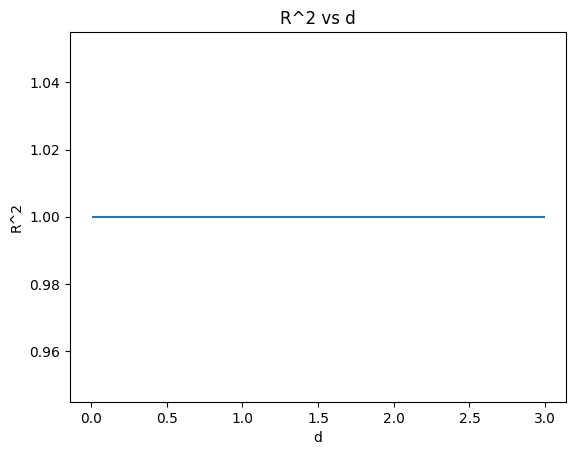

In [10]:
test_range=np.arange(0.01, 3, 0.01)
res_d=[]
res_r2=[]
for d in test_range:
    df=pd.DataFrame({'test':cumsum_x})
    df_=frac_diff_fixed_width_window(df, 1)
    t_=t[-len(df_['test']):]

    ff=np.fft.fftfreq(len(t_), t_[1]-t_[0])
    y_freq=abs(np.fft.fft(df_['test'].values))
    guess_freq=abs(ff[np.argmax(y_freq[1:])+1])
    guess_amp=np.std(df_['test'].values)*np.sqrt(2)
    guess_offset=np.mean(df_['test'].values)
    initial_guess = [guess_amp, 2*np.pi*guess_freq, 0, guess_offset]

    params, _ = curve_fit(sine_func, t_, df_['test'], p0=initial_guess, maxfev=10000)
    y_fit = sine_func(t_, *params)
    r_2=np.sum((y_fit-np.mean(df_['test'])) ** 2)/np.sum((df_['test']-np.mean(df_['test'])) ** 2)
    res_d.append(d)
    res_r2.append(r_2)
plt.plot(res_d, res_r2)
plt.xlabel('d')
plt.ylabel('R^2')
plt.title('R^2 vs d')
plt.show()

5.4 Take the dollar bar series on E-mini S&P 500 futures.   
Using the code in Snippet 5.3, for some d ∈ [0,2], compute fracDiff_FFD(fracDiff  
_FFD(series,d),-d).What doyou get? Why?  

In [11]:
from utils import get_dollar_bars

min_df=pd.read_csv("./GSPC.INDX_1m.csv", index_col=0, parse_dates=True)
dollar_M=1000000
dollar_bars=get_dollar_bars(min_df, dollar_M*60)

In [12]:
# d=0.5
# df_=frac_diff_fixed_width_window(dollar_bars[['Close']], d)
# df_=frac_diff_fixed_width_window(df_, -d, 1e-3)
# result = adfuller(df_['Close'])
# print('d: %f, ADF Statistic: %f' % (d, result[0]), 'P-value: %f' % result[1])
# plt.plot(dollar_bars['Close'], label='Original Data')
# plt.plot(df_['Close'], label='Fractional Differenced Data', color='red')
# plt.legend()
# plt.show()

5.5 Take the dollar bar series on E-mini S&P 500 futures.

(a) Form a new series as acumulative sum of log-prices.

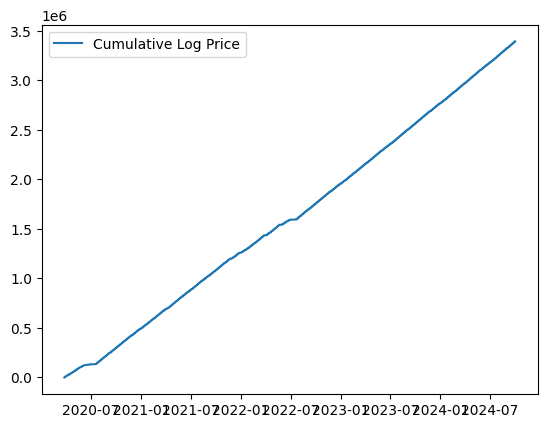

In [13]:
cumsum_log_dollar_bar=np.cumsum(np.log(dollar_bars['Close']))
plt.plot(cumsum_log_dollar_bar, label='Cumulative Log Price')
plt.legend()
plt.show()

(b) Apply FFD, with 𝜏 = 1E−5. Determine for what minimum d ∈ [0,2] the
new series is stationary.

In [14]:
d_range=np.arange(0.1, 1, 0.1)
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.stats.diagnostic import het_arch

cumsum_log_dollar_df=pd.DataFrame({'Close':dollar_bars['Close']})
for d in d_range:
    df_=frational_diff(cumsum_log_dollar_df, d, 1e-2)
    if len(df_['Close'])<1: continue
    result_1 = adfuller(df_['Close']) # idential distribution test
    result_2 = acorr_ljungbox(df_['Close'], lags=[10], return_df=True) # independence test
    result_3 = het_arch(df_['Close']) # heteroscedasticity test
    print('d: %f, ADF Statistic: %f' % (d, result_1[0]), 'P-value: %f' % result_1[1])
    print('Ljung-Box Statistic: %f' % result_2['lb_stat'].values[0], 'P-value: %f' % result_2['lb_pvalue'].values[0])
    print('ARCH Statistic: %f' % result_3[0], 'P-value: %f' % result_3[1])
    if result_1[1] < 0.05 and result_2['lb_pvalue'].values[0] < 0.05 and result_3[1] < 0.05:
        break

d: 0.100000, ADF Statistic: -1.615625 P-value: 0.475024
Ljung-Box Statistic: 1952399.668459 P-value: 0.000000
ARCH Statistic: 195350.752249 P-value: 0.000000
d: 0.200000, ADF Statistic: -4.574792 P-value: 0.000144
Ljung-Box Statistic: 2943923.074273 P-value: 0.000000
ARCH Statistic: 295649.877900 P-value: 0.000000


(c) Compute the correlation of the fracdiff series to the original(untransformed)
series.

In [15]:
intersection_idx=cumsum_log_dollar_df.index.intersection(df_.index)
corr=cumsum_log_dollar_df.loc[intersection_idx].corrwith(df_.loc[intersection_idx])
print('Correlation: %f' % corr['Close'])

Correlation: 0.866688


(d) Apply an Engel-Granger cointegration test on the original and fracdiff series.
Are they cointegrated? Why?

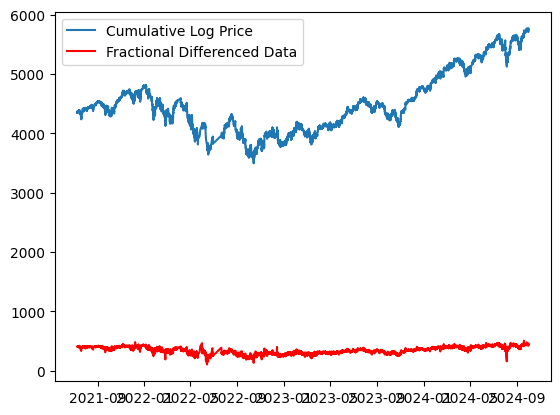

Engle-Granger Cointegration Test
Statistic: -7.219857385964972
P-value: 1.758250381281182e-09
Null: No Cointegration, Alternative: Cointegration
ADF Lag length: 38
Trend: c
Estimated Root ρ (γ+1): 0.9991699262884508
Distribution Order: 1


In [16]:
from arch.unitroot import engle_granger
plt.plot(cumsum_log_dollar_df.loc[intersection_idx, 'Close'], label='Cumulative Log Price')
plt.plot(df_.loc[intersection_idx, 'Close'], label='Fractional Differenced Data', color='red')
plt.legend()
plt.show()
eg=engle_granger(cumsum_log_dollar_df.loc[intersection_idx, 'Close'], df_.loc[intersection_idx, 'Close'], trend='c')
print(eg)

(e) Apply a Jarque-Bera normality test on the fracdiff series.

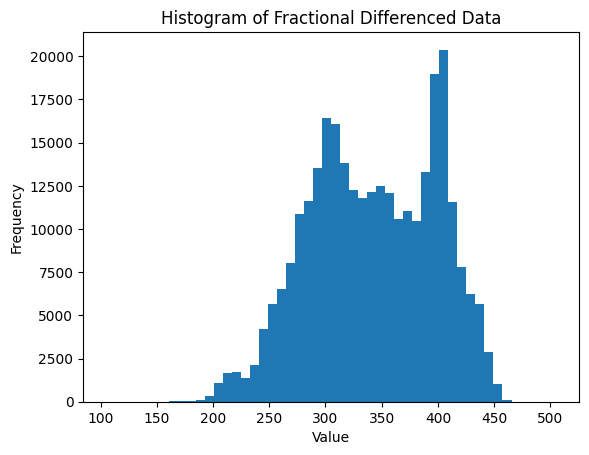

Jarque-Bera Statistic: 10024.454380 P-value: 0.000000


In [17]:
from scipy.stats import jarque_bera
plt.hist(df_['Close'], bins=50)
plt.title('Histogram of Fractional Differenced Data')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.show()
jb=jarque_bera(df_['Close'])
print('Jarque-Bera Statistic: %f' % jb.statistic, 'P-value: %f' % jb.pvalue)

5.6 Take the fracdiffseries from exercise 5.   
(a) Apply a CUSUM filter (Chapter 2), where h is twice the standard deviation
of the series. 

406316 296124
0.16169061309324206 55.9569058126346
2.1162694559920965 55.9569058126346
1.788974640040351 55.9569058126346
1.1075263712564265 55.9569058126346
1.6864914075702018 55.9569058126346
1.2369724173224768 55.9569058126346
2.057892003043662 55.9569058126346
2.1552367645433606 55.9569058126346
3.304334950694056 55.9569058126346
4.321009925537055 55.9569058126346
2.8721560186697843 55.9569058126346
2.73035118267876 55.9569058126346
3.2190076120434696 55.9569058126346
3.1386416665095567 55.9569058126346
2.5710426693156023 55.9569058126346
2.375799044631549 55.9569058126346
2.3608570443409462 55.9569058126346
2.173231132392857 55.9569058126346
2.233296509235288 55.9569058126346
3.6874959543977184 55.9569058126346
2.520755352957849 55.9569058126346
2.527232357152343 55.9569058126346
2.5059071011512515 55.9569058126346
2.337750065071077 55.9569058126346
3.3560999586654816 55.9569058126346
3.256575687889608 55.9569058126346
5.034772530454347 55.9569058126346
3.0505991254174205 55.95690

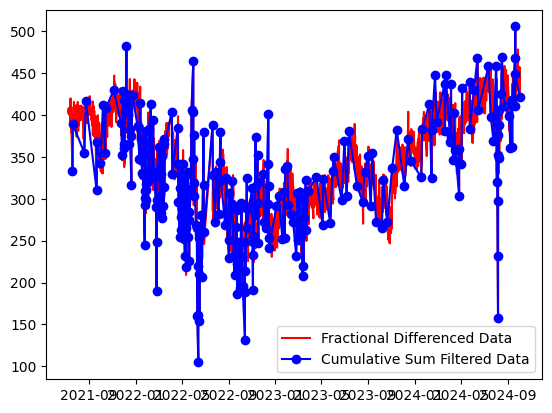

In [ ]:
def apply_cumsum_filter(df: pd.DataFrame, filter_s: pd.Series):
    diff = df["Close"].diff().dropna()
    intersect_idx = diff.index.intersection(filter_s.index)

    # index 통일
    diff = diff.loc[intersect_idx]
    filter_s = filter_s.loc[intersect_idx]
    df = df.loc[intersect_idx]

    s_pos, s_neg = 0, 0
    times = []

    for i in range(len(diff)):
        s_pos = max(0, s_pos + diff.iloc[i])
        s_neg = min(0, s_neg + diff.iloc[i])
        s = max(s_pos, -s_neg)
        if s > filter_s.iloc[i]:
            if s_pos > -s_neg:
                s_pos = 0
                times.append(diff.index[i])
            else:
                s_neg = 0
                times.append(diff.index[i])
    return pd.DatetimeIndex(times)
std=df_['Close'].std()
filter_s=pd.Series(data=[std]*len(df_.index) ,index=df_.index) # 2*std -> std (데이터 부족)
cumsum_bar=apply_cumsum_filter(df_, filter_s)
plt.plot(df_['Close'], label='Fractional Differenced Data', color='red')
plt.plot(df_.loc[cumsum_bar, 'Close'], label='Cumulative Sum Filtered Data', marker='o', color='blue')
plt.legend()
plt.show()

(b) Use the filtered timestamps to sample a features’ matrix. Use as one of the
features thefracdiff value.

In [27]:
from utils import get_ema_daily_volatility, get_vertical_barrier, get_events
X=pd.DataFrame()
X['Close']=df_.loc[cumsum_bar, 'Close']
X['Close_lag1']=X['Close'].shift(1)
X['Close_lag2']=X['Close'].shift(2)
X['Close_std']=get_ema_daily_volatility(X['Close'])
X.dropna(inplace=True, how='any')

(c) Form labels using the triple-barrier method, with symmetric horizontal bar-
riersof twice thedaily standard deviation, and avertical barrier of 5days.

In [30]:
def get_bins(events: pd.DataFrame, close: pd.Series, vertical_barrier: pd.Series):
    """
    Get the bins for the events.

    :param events: pd.DataFrame The events dataframe containing the event times and labels.
    close: pd.Series The close price series.
    t1: pd.Series
        The vertical barrier time series.
    :return: pd.DataFrame
        A dataframe with the event times and the corresponding bins.
        (0: touch vertical barrier, 1: profit taking, -1: stop loss)
    """
    # check vertical barrier touch first
    vt_time_stamp = pd.DatetimeIndex([])
    for loc, touch_time in events["t1"].dropna().items():
        if (loc in vertical_barrier.index) and vertical_barrier.loc[loc] == touch_time:
            vt_time_stamp = vt_time_stamp.append(pd.DatetimeIndex([loc]))

    # check event time
    events_ = events.dropna(subset=["t1"])
    price_idx = events_.index.union(events_["t1"].values).drop_duplicates()
    price = close.reindex(price_idx, method="bfill")
    ret = pd.DataFrame(index=events_.index)
    ret["ret"] = price.loc[events_["t1"]].values / price.loc[events_.index].values - 1
    ret["bin"] = np.sign(ret["ret"])
    ret.loc[vt_time_stamp, "bin"] = 0
    return ret

vertical_barrier=get_vertical_barrier(dollar_bars['Close'], cumsum_bar, 5)
daily_volatility=get_ema_daily_volatility(dollar_bars['Close'], 100).loc[cumsum_bar]
events=get_events(dollar_bars['Close'], daily_volatility.index, (1,1), daily_volatility, t1=vertical_barrier)
labels=get_bins(events, dollar_bars['Close'], vertical_barrier)
print(labels['bin'].value_counts())
print(labels)

bin
-1.0    129
 1.0    122
 0.0     26
Name: count, dtype: int64
                          ret  bin
2021-07-19 13:31:00 -0.003879 -1.0
2021-07-20 13:55:00  0.012150  1.0
2021-08-19 13:31:00  0.004563  1.0
2021-08-23 13:31:00  0.001721  1.0
2021-09-20 13:31:00  0.002945  1.0
...                       ...  ...
2024-09-18 14:00:00 -0.003550 -1.0
2024-09-18 15:48:00  0.016180  1.0
2024-09-19 09:31:00 -0.003574 -1.0
2024-09-19 09:46:00  0.005498  1.0
2024-09-30 14:21:00  0.001367  1.0

[277 rows x 2 columns]


(d) Fit abagging classifier of decision trees where:  
(i) The observed features are bootstrapped using the sequential method
from Chapter 4.

In [ ]:
def get_indicator_mat(bar_index:pd.DatetimeIndex, t1:pd.Series):
    '''
    Return indicator matrix that a binary matrix indicates what (price) bars influence the label for each observation.
    '''
    mat=pd.DataFrame(0, index=bar_index, columns=range(t1.shape[0]))
    for i, (t_in, t_out) in enumerate(t1.items()):
        mat.loc[t_in:t_out, i]=1
    return mat

def get_avg_uniqueness(indicator_mat:pd.DataFrame):
    '''
    Return average uniqueness of each observed features
    '''
    c=indicator_mat.sum(axis=1) # concurrency
    u=indicator_mat.div(c, axis=0) # uniqueness
    avg_u=u[u>0].mean()
    return avg_u

# def seq_boot_strap(indicator_mat:pd.DataFrame, n:int=None):
#     '''
#     Generate bootstrap a sample via sequential bootstrap
#     '''
#     if n is None:
#         n=indicator_mat.shape[1]
#     ret=[]
#     while len(ret)<n:
#         avg_u=pd.Series()
#         for i in indicator_mat: # iter over columns
#             indicator_mat_=indicator_mat[ret+[i]]
#             avg_u[i]=get_avg_uniqueness(indicator_mat_).iloc[-1]
#         prob=avg_u/avg_u.sum()
#         ret+=[np.random.choice(indicator_mat.columns, p=prob)]
#         print(ret)
#     return ret
avg_u_cache = {}

def fast_seq_boot_strap(indicator_mat: pd.DataFrame, n: int = None):
    if n is None:
        n = indicator_mat.shape[1]
    ret = []

    for _ in range(n):
        avg_u = pd.Series(index=indicator_mat.columns, dtype='float64')

        for i in indicator_mat.columns:
            key = tuple(sorted(ret + [i]))
            if key in avg_u_cache:
                avg_u[i] = avg_u_cache[key]
            else:
                sub_mat = indicator_mat[list(key)]
                u = get_avg_uniqueness(sub_mat).iloc[-1]
                avg_u[i] = u
                avg_u_cache[key] = u

        prob = avg_u / avg_u.sum()
        sampled = np.random.choice(indicator_mat.columns, p=prob)
        ret.append(sampled)

    return ret

indicator_mat=get_indicator_mat(dollar_bars.index, events['t1'])
boot_strap=fast_seq_boot_strap(indicator_mat, 10)

(ii) On each bootstrapped sample,sample weights are determined using the
techniques from Chapter 4.

In [ ]:
def get_num_concurrent_events(close_idx:pd.DatetimeIndex, t1:pd.Series, molecule:None):
    t1=t1.fillna(close_idx[-1])
    if molecule is not None:
        t1=t1[t1>=molecule[0]]
        t1=t1[:t1[molecule].max()]
    temp_iloc=close_idx.searchsorted(np.array([t1.index[0], t1.max()]))
    count=pd.Series(0, index=close_idx[temp_iloc[0]:temp_iloc[1]+1])
    for t_in, t_out in t1.items():
        count.loc[t_in:t_out]+=1
    return count


def get_sample_weights(t1:pd.Series, num_concurrent_events:pd.Series, close:pd.Series, molecule:None):
    '''
    Get sample weight based on return attribution
    '''
    if molecule is None:
        weight=pd.Series(index=molecule)
    else:
        weight=pd.Series(index=t1.index)
    ret=np.log(close).diff() # log return
    for t_in , t_out in t1.loc[weight.index].items():
        weight.loc[t_in]=(ret.loc[t_in:t_out]/num_concurrent_events.loc[t_in:t_out]).sum()
    return weight.abs()

num_concurrent_events=get_num_concurrent_events(dollar_bars.index, events['t1'], None)
sample_weights=get_sample_weights(events['t1'], num_concurrent_events, dollar_bars['Close'], None)
train_indicator_mat=get_indicator_mat(dollar_bars.index, events['t1'][:int(len(events['t1'])*0.8)])

from sklearn.tree import DecisionTreeClassifier
n_esimators=1
models=[]

for i in range(n_esimators):
    # bootstrap
    boot_iloc=fast_seq_boot_strap(train_indicator_mat)
    boot_x=[X.iloc[boot_iloc[j]] for j in range(len(boot_iloc))]
    boot_x=pd.concat(boot_x, axis=0)
    boot_y=[labels.iloc[boot_iloc[j]] for j in range(len(boot_iloc))]
    boot_y=pd.concat(boot_y, axis=0)
    boot_y=boot_y['bin']

    # get sample weights
    boot_sample_weights=[sample_weights.iloc[boot_iloc[j]] for j in range(len(boot_iloc))]
    boot_sample_weights=pd.concat(boot_sample_weights, axis=0)

    model=DecisionTreeClassifier(max_depth=5)
    model.fit(boot_x, boot_y, sample_weight=boot_sample_weights)
    models.append(model)


def predict(models, x: pd.DataFrame, classes=[-1, 0, 1]):
    """
    Soft-voting 기반 3-class 예측 함수
    """
    n_class = len(classes)
    proba = np.zeros((x.shape[0], n_class))

    for model in models:
        model_proba = model.predict_proba(x)
        # sklearn은 클래스 정렬이 항상 model.classes_ 순서로 나옴
        # 따라서 proba 매트릭스를 classes 기준에 맞게 재정렬
        for i, cls in enumerate(classes):
            if cls in model.classes_:
                proba[:, i] += model_proba[:, list(model.classes_).index(cls)]

    # 평균 soft voting
    proba /= len(models)

    # 최종 예측: 확률이 가장 높은 클래스 선택
    pred_class = np.array(classes)[np.argmax(proba, axis=1)]
    return pd.Series(pred_class, index=x.index)


pred = predict(models, X[int(len(events['t1'])*0.8):])
labels=labels[int(len(events['t1'])*0.8):]['bin']
print('accuracy: %f' % (pred == labels).mean())
